# 0.0 IMPORTS

In [173]:
import pandas as pd
import numpy  as np
import warnings 

from datetime import datetime

import seaborn           as sns
import matplotlib.pyplot as plt
import folium
from folium import plugins

from IPython.display       import Image
from IPython.core.display  import HTML

warnings.filterwarnings( 'ignore' )

## 0.1 Helper Functions

In [130]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline

    plt.style.use('bmh')
    plt.rcParams['figure.figsize'] = [25, 10]
    plt.rcParams['font.size'] = 24

    display(HTML('<style>.container {width:100% !important;}</style>'))
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option('display.expand_frame_repr', False)

    sns.set()

In [131]:
jupyter_settings()

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


## 0.2 Loading Data

In [132]:
df_raw = pd.read_csv('Crime_Data_from_2020_to_Present.csv')

In [133]:
df_raw.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,0444 0913,36,F,B,501.0,SINGLE FAMILY DWELLING,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,0416 1822 1414,25,M,H,102.0,SIDEWALK,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,04/14/2020 12:00:00 AM,02/13/2020 12:00:00 AM,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,1501,0,X,X,726.0,POLICE FACILITY,NaN,NaN,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),0329 1402,76,F,W,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0329,31,X,X,409.0,BEAUTY SUPPLY STORE,NaN,NaN,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


# 0.3 Dicionário

- **YearStart:** Year start
- **YearEnd:** Year End (for single-year indicator, year end=year start)
- **LocationAbbr:** Location abbreviation
- **LocationDesc:** Location description
- **Datasource:** Name or abbreviation of Data Source
- **Class:** Class Description
- **Topic:** Topic Description
- **Question:** Question Description
- **Data_Value_Unit:** Description of unit e.g. %, etc
- **Data_Value_Type:** Description of type of data e.g. Value, Percentage, Number
- **Data_Value:** Data value (percentage, text)
- **Data_Value_Alt:** Numeric representation of data value
- **Data_Value_Footnote_Symbol:** Symbol that would be used to flag footnotes
- **Data_Value_Footnote:** Footnote text
- **Low_Confidence_Limit:** Low 95% Confidence Interval value
- **High_Confidence_Limit:** High 95% Confidence Interval value
- **Sample_Size:** Sample Size
- **Total:** Total/Overall breakout category
- **Age(years):** Age (years) breakout category
- **Education:** Education breakout category
- **Gender:** Gender breakout category
- **Income:** Income breakout category
- **Race/Ethnicity:** Race/Ethnicity breakout category
- **GeoLocation:** Latitude & Longitude to be provided for formatting GeoLocation or Geocode in the format (latitude, longitude)
- **ClassID:** Lookup identifier value for Class
- **TopicID:** Lookup identifier value for Topic
- **QuestionID:** Lookup identifier value for Question
- **DataValueTypeID:** Lookup identifier value for Data_Value_type
- **LocationID:** Lookup identifier value for Location
- **StratificationCategory1:** Lookup Identification value, such as Age Group, Gender
- **Stratification1:** Data stratified by this value, such as Male, Female, Total
- **StratificationCategoryId1:** Lookup identifier value for Stratification1
- **StratificationID1:** Lookup identifier value for StratificationCategory1

# 1.0 DESCRIÇÃO DOS DADOS

In [134]:
df1 = df_raw.copy()

## 1.1 Renomeando colunas

In [135]:
cols_nova = ['dr_no', 'date_reported', 'date_occurrency', 'time_occurrency', 'area', 'area_name',
       'rpt_dist_no', 'part_1-2', 'crm_cd', 'crm_cd_desc', 'mocodes',
       'vict_age', 'vict_sex', 'vict_descent', 'premis_cd', 'premis_desc',
       'weapon_used_cd', 'weapon_desc', 'status', 'status_desc', 'crm_cd_1',
       'crm_cd_2', 'crm_cd_3', 'crm_cd_4', 'location', 'cross_street', 'lat',
       'lon']

In [136]:
#renomeando
df1.columns = cols_nova

## 1.2 Data Dimensions

In [137]:
print('Número de linhas: {}'.format(df1.shape[0]))
print('Número de colunas: {}'.format(df1.shape[1]))

Número de linhas: 668881
Número de colunas: 28


## 1.3 Data Types

In [138]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 668881 entries, 0 to 668880
Data columns (total 28 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   dr_no            668881 non-null  int64  
 1   date_reported    668881 non-null  object 
 2   date_occurrency  668881 non-null  object 
 3   time_occurrency  668881 non-null  int64  
 4   area             668881 non-null  int64  
 5   area_name        668881 non-null  object 
 6   rpt_dist_no      668881 non-null  int64  
 7   part_1-2         668881 non-null  int64  
 8   crm_cd           668881 non-null  int64  
 9   crm_cd_desc      668881 non-null  object 
 10  mocodes          576907 non-null  object 
 11  vict_age         668881 non-null  int64  
 12  vict_sex         581251 non-null  object 
 13  vict_descent     581247 non-null  object 
 14  premis_cd        668873 non-null  float64
 15  premis_desc      668548 non-null  object 
 16  weapon_used_cd   233069 non-null  floa

## 1.4 Check NA

In [139]:
df_na = df1.isna().sum().sort_values(ascending=False)/df1.shape[0]*100
df_na

crm_cd_4           99.992375
crm_cd_3           99.746143
crm_cd_2           92.509579
cross_street       83.635206
weapon_used_cd     65.155386
weapon_desc        65.155386
mocodes            13.750428
vict_descent       13.101583
vict_sex           13.100985
premis_desc         0.049785
premis_cd           0.001196
crm_cd_1            0.001196
lat                 0.000000
location            0.000000
status_desc         0.000000
status              0.000000
dr_no               0.000000
date_reported       0.000000
vict_age            0.000000
crm_cd_desc         0.000000
crm_cd              0.000000
part_1-2            0.000000
rpt_dist_no         0.000000
area_name           0.000000
area                0.000000
time_occurrency     0.000000
date_occurrency     0.000000
lon                 0.000000
dtype: float64

In [140]:
# Selecionando colunas
cols_analise = df_na[df_na <= 20].index
cols_analise

Index(['mocodes', 'vict_descent', 'vict_sex', 'premis_desc', 'premis_cd',
       'crm_cd_1', 'lat', 'location', 'status_desc', 'status', 'dr_no',
       'date_reported', 'vict_age', 'crm_cd_desc', 'crm_cd', 'part_1-2',
       'rpt_dist_no', 'area_name', 'area', 'time_occurrency',
       'date_occurrency', 'lon'],
      dtype='object')

In [141]:
df1 = df1[cols_analise]

## 1.5 Fill NA

In [142]:
df1['mocodes'].fillna(0, inplace=True)
df1['vict_descent'].fillna('X', inplace=True)
df1['vict_sex'].fillna('X', inplace=True)
df1['premis_desc'].fillna('unknown', inplace=True)
df1['premis_cd'].fillna('unknown', inplace=True)
df1['crm_cd_1'].fillna('unknown', inplace=True)

In [143]:
df1.isna().sum().sort_values(ascending=False)/df1.shape[0]*100

mocodes            0.0
vict_descent       0.0
date_occurrency    0.0
time_occurrency    0.0
area               0.0
area_name          0.0
rpt_dist_no        0.0
part_1-2           0.0
crm_cd             0.0
crm_cd_desc        0.0
vict_age           0.0
date_reported      0.0
dr_no              0.0
status             0.0
status_desc        0.0
location           0.0
lat                0.0
crm_cd_1           0.0
premis_cd          0.0
premis_desc        0.0
vict_sex           0.0
lon                0.0
dtype: float64

## 1.6 Change Data Types

In [144]:
df1.dtypes

mocodes             object
vict_descent        object
vict_sex            object
premis_desc         object
premis_cd           object
crm_cd_1            object
lat                float64
location            object
status_desc         object
status              object
dr_no                int64
date_reported       object
vict_age             int64
crm_cd_desc         object
crm_cd               int64
part_1-2             int64
rpt_dist_no          int64
area_name           object
area                 int64
time_occurrency      int64
date_occurrency     object
lon                float64
dtype: object

In [145]:
# Mudança para formato de data
df1['date_reported'] = pd.to_datetime(df1['date_reported'])
df1['date_occurrency'] = pd.to_datetime(df1['date_reported'])

# Acrescentando dois pontos nas horas
df1['time_occurrency'] = df1['time_occurrency'].astype(str)
df1['time_occurrency'] = df1['time_occurrency'].apply(lambda x: x[:-2] + ":" + x[-2:])

# Mudança para formato string
df1['rpt_dist_no'] = df1['rpt_dist_no'].astype(str)
df1['premis_cd'] = df1['premis_cd'].astype(str)
df1['crm_cd_1'] = df1['crm_cd_1'].astype(str)
df1['part_1-2'] = df1['part_1-2'].astype(str)
df1['crm_cd'] = df1['crm_cd'].astype(str)
df1['dr_no'] = df1['dr_no'].astype(str)
df1['area'] = df1['area'].astype(str)

In [146]:
df1.dtypes

mocodes                    object
vict_descent               object
vict_sex                   object
premis_desc                object
premis_cd                  object
crm_cd_1                   object
lat                       float64
location                   object
status_desc                object
status                     object
dr_no                      object
date_reported      datetime64[ns]
vict_age                    int64
crm_cd_desc                object
crm_cd                     object
part_1-2                   object
rpt_dist_no                object
area_name                  object
area                       object
time_occurrency            object
date_occurrency    datetime64[ns]
lon                       float64
dtype: object

## 1.7 Adicionando colunas

In [147]:
dic = {
 'A': 'Other Asian',
 'B': 'Black',
 'C': 'Chinese',
 'D': 'Cambodian',
 'F': 'Filipino',
 'G': 'Guamanian',
 'H': 'Hispanic/Latin/Mexican',
 'I': 'American Indian/Alaskan Native',
 'J': 'Japanese',
 'K': 'Korean',
 'L': 'Laotian',
 'O': 'Other',
 'P': 'Pacific Islander',
 'S': 'Samoan',
 'U': 'Hawaiian',
 'V': 'Vietnamese',
 'W': 'White',
 'X': 'Unknown',
 'Z': 'Asian Indian'
}

dim_vict_descent = pd.DataFrame([dic]).T.reset_index()
colunas = ['vict_descent', 'vict_descent_desc']
dim_vict_descent.columns = colunas
dim_vict_descent

,vict_descent,vict_descent_desc
0,A,Other Asian
1,B,Black
2,C,Chinese
3,D,Cambodian
4,F,Filipino
5,G,Guamanian
6,H,Hispanic/Latin/Mexican
7,I,American Indian/Alaskan Native
8,J,Japanese
9,K,Korean


In [148]:
df1 = pd.merge(df1, dim_vict_descent, on='vict_descent', how='left')

In [149]:
df1.columns

Index(['mocodes', 'vict_descent', 'vict_sex', 'premis_desc', 'premis_cd',
       'crm_cd_1', 'lat', 'location', 'status_desc', 'status', 'dr_no',
       'date_reported', 'vict_age', 'crm_cd_desc', 'crm_cd', 'part_1-2',
       'rpt_dist_no', 'area_name', 'area', 'time_occurrency',
       'date_occurrency', 'lon', 'vict_descent_desc'],
      dtype='object')

## 1.7 Descriptive Statistical

In [150]:
num_attributes = df1.select_dtypes(include=['int64', 'float64',])
cat_attributes = df1.select_dtypes(exclude=['int64', 'float64', 'datetime64[ns]'])

### 1.7.1 Análise estatística

In [151]:
# Tendência central - média e mediana
ct1 = pd.DataFrame(num_attributes.apply(np.mean)).T
ct2 = pd.DataFrame(num_attributes.apply(np.median)).T

# Dispersão - desvio padrão, min, max, assimetria, curtose
d1 = pd.DataFrame(num_attributes.apply(np.std)).T
d2 = pd.DataFrame(num_attributes.apply(min)).T
d3 = pd.DataFrame(num_attributes.apply(max)).T
d4 = pd.DataFrame(num_attributes.apply(lambda x: x.max()-x.min())).T
d5 = pd.DataFrame(num_attributes.apply(lambda x: x.skew())).T
d6 = pd.DataFrame(num_attributes.apply(lambda x: x.kurtosis())).T

# Concatenate
m = pd.concat([d2, d3, d4, ct1, ct2, d1, d5, d6]).T.reset_index()
m.columns = ['attributes', 'min', 'max', 'range', 'mean', 'median', 'std', 'assimetria', 'curtose']
m

,attributes,min,max,range,mean,median,std,assimetria,curtose
0,lat,0.0000,34.3343,34.3343,33.958083,34.0583,1.982980,-17.012549,288.349302
1,vict_age,-2.0000,120.0000,122.0000,29.999662,31.0000,21.669342,0.106004,-0.741468
2,lon,-118.6676,0.0000,118.6676,-117.952966,-118.3214,6.877822,17.087545,290.052869


A partir das métricas ácima, da variável vict_age (idade da vitima), é possível notar que não há desvio na distribuição, uma vez que a assimetria se encontra próximo de 0, além disso, a média e mediana apresentam valores próximos, ratificando a simetria da distribuição. Entretanto, uma curtose negativa pode indicar um desvio do comportamento de uma distribuição normal, quando a curtose é igual a 3. 

### 1.7.2 Análise de variáveis categóricas

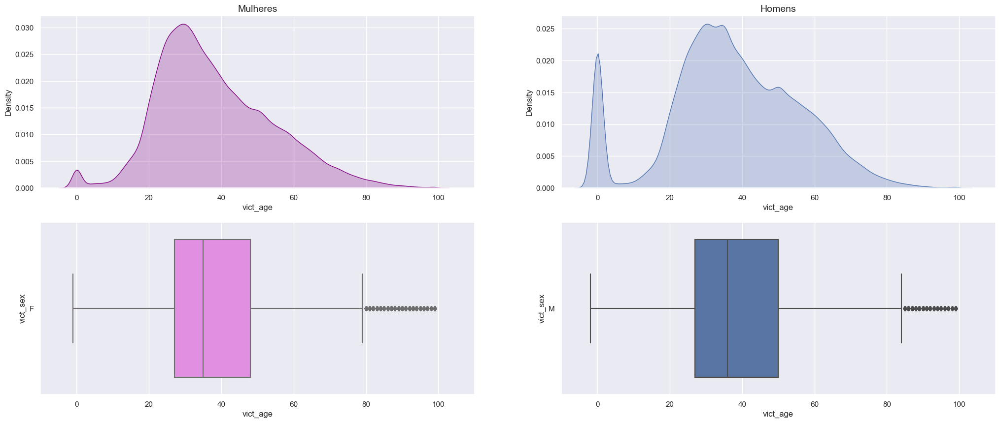

In [152]:
df1_fem = df1[df1['vict_sex'] == 'F']
df1_mas = df1[df1['vict_sex'] == 'M']

plt.subplot(2, 2, 1)
sns.kdeplot(data=df1_fem, x=df1_fem['vict_age'], shade=True, color='Purple');
plt.title('Mulheres', fontsize=14)
plt.xlim([-10, 110]);

plt.subplot(2, 2, 3)
sns.boxplot(x=df1_fem['vict_age'], y=df1_fem['vict_sex'], data=df1_fem, color='Violet');
plt.xlim([-10, 110]);

plt.subplot(2, 2, 2)
sns.kdeplot(data=df1_mas, x=df1_mas['vict_age'], shade=True);
plt.title('Homens', fontsize=14)
plt.xlim([-10, 110]);

plt.subplot(2, 2, 4)
sns.boxplot(x=df1_mas['vict_age'], y=df1_mas['vict_sex'], data=df1_mas);
plt.xlim([-10, 110]);

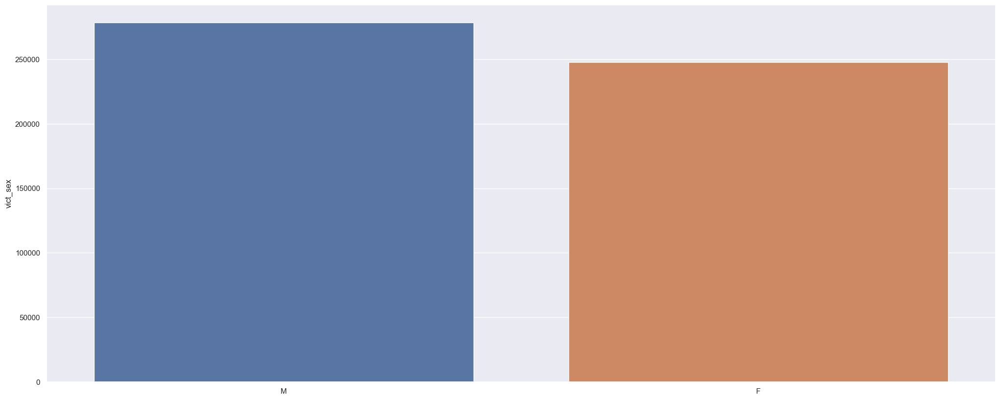

In [153]:
vict_sex_count = df1.loc[(df1['vict_sex']=='M') | (df1['vict_sex']=='F')]['vict_sex'].value_counts()
vict_sex_count.index
sns.barplot(x=vict_sex_count.index, y=vict_sex_count);

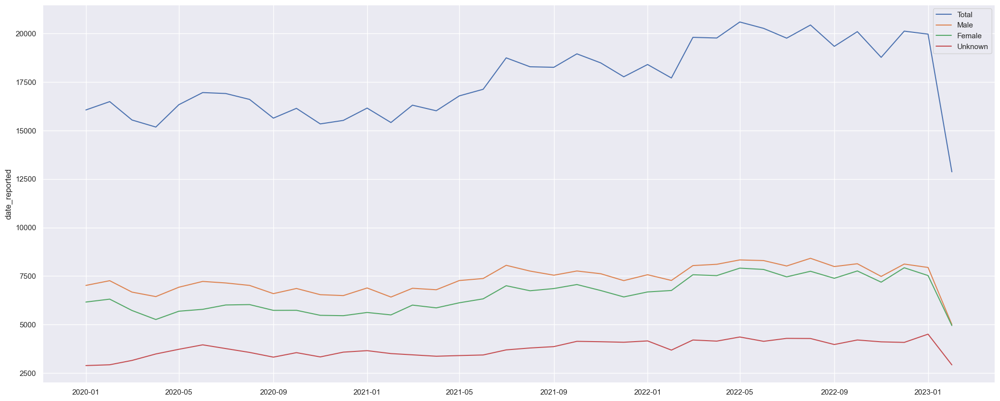

In [154]:
# Quantidade total de crimes
crimes_year = pd.to_datetime(df1['date_reported'].dt.strftime('%Y-%m')).value_counts().sort_index()
sns.lineplot(x=crimes_year.index, y=crimes_year, label='Total');

# Quantidade de crimes relacionados a homens
crimes_year_m = pd.to_datetime(df1.loc[df1['vict_sex']=='M']['date_reported'].dt.strftime('%Y-%m')).value_counts().sort_index()
sns.lineplot(x=crimes_year_m.index, y=crimes_year_m, label='Male');

# Quantidade de crimes relacionados a mulheres
crimes_year_f = pd.to_datetime(df1.loc[df1['vict_sex']=='F']['date_reported'].dt.strftime('%Y-%m')).value_counts().sort_index()
sns.lineplot(x=crimes_year_f.index, y=crimes_year_f, label='Female');

# Quantidade de crimes relacionados a genero "desconhecido"
crimes_year_x = pd.to_datetime(df1.loc[df1['vict_sex']=='X']['date_reported'].dt.strftime('%Y-%m')).value_counts().sort_index()
sns.lineplot(x=crimes_year_x.index, y=crimes_year_x, label='Unknown');

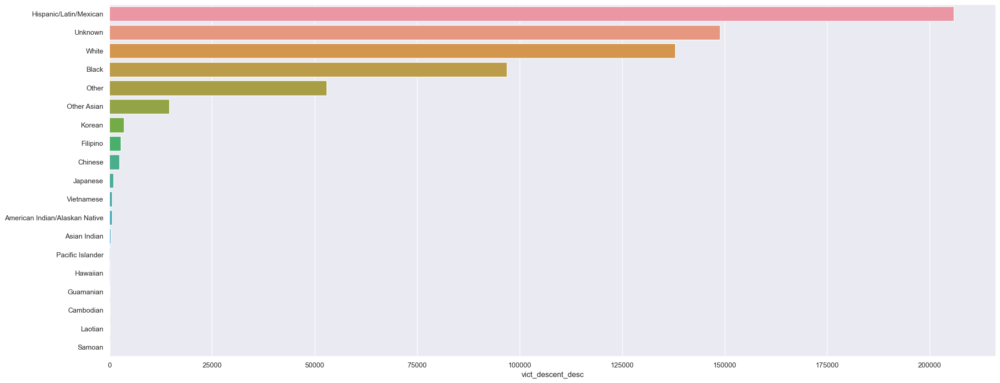

In [155]:
vict_descent_count = df1['vict_descent_desc'].value_counts()
sns.barplot(x=vict_descent_count, y=vict_descent_count.index);

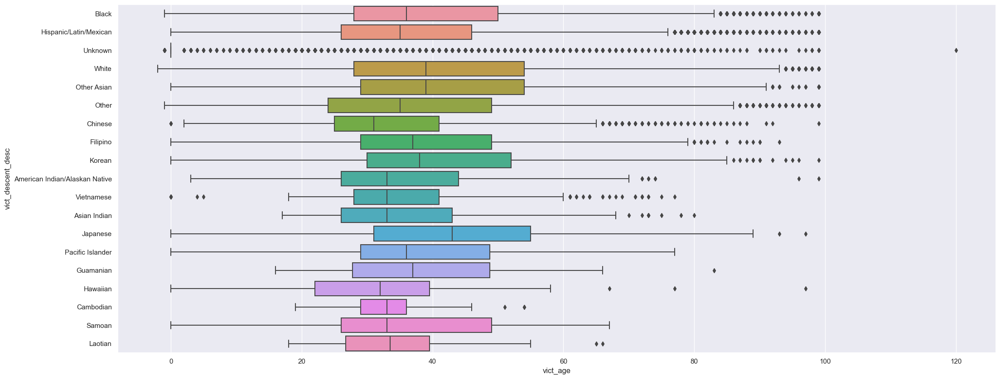

In [156]:
sns.boxplot(x=df1['vict_age'], y=df1['vict_descent_desc']);

## Análise Geográfica

In [165]:
coordenadas = []
for lat, long in zip(df1.lat.values, df1.lon.values):
    coordenadas.append([lat, long])

In [184]:
mapa = folium.Map(location   = [35.27378775813666, -117.5595772602388],
                  zoom_start = 7,
                  tiles      = 'OpenStreetMap'
                 )

In [185]:
mapa.add_child(plugins.HeatMap(coordenadas))

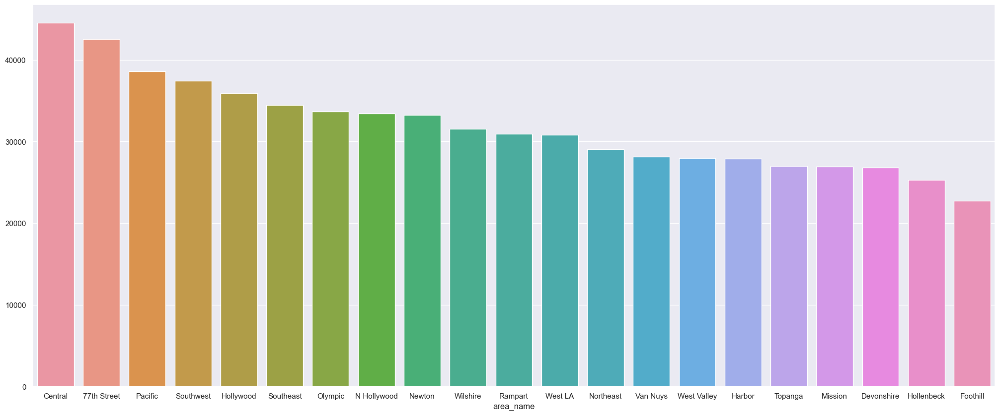

In [195]:
crimes_area = df1['area_name'].value_counts()
sns.barplot(x=crimes_area.index, y=crimes_area);
plt.ylabel('');
plt.xlabel('area_name');

## Análise período do dia

In [207]:
#separar o dia em manhã, tarde e noite e verificar a quantidade de crimes em cada período
print(df1['time_occurrency'][1])
print(df1['time_occurrency'][1].split(":")[0])

#Definindo períodos:
# 1 - madrugada
# 2 - manhã
# 3 - tarde
# 4 - noite

3:30
3


## TOP 10 - Crimes mais cometidos

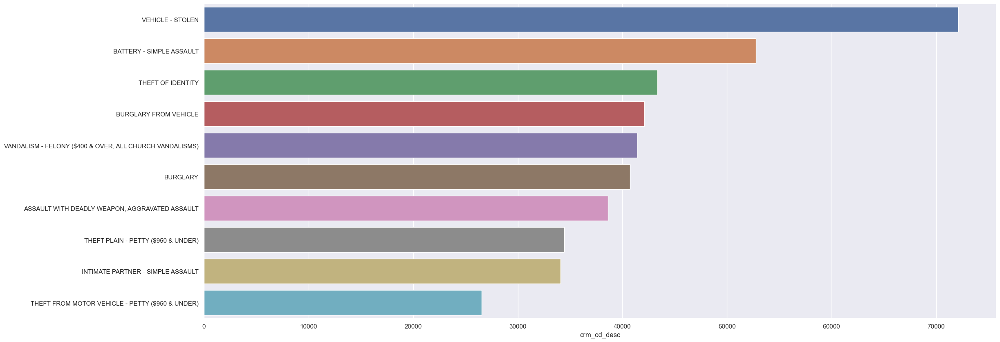

In [222]:
crimes_desc = df1['crm_cd_desc'].value_counts().head(10)
sns.barplot(x=crimes_desc, y=crimes_desc.index);

# 2.0 FEATURE ENGINEERING

In [223]:
df2 = df1.copy()

## 2.1 Criação de Hipóteses

### 2.1.1 Hipóteses Loja

**1.** Lojas com maior quadro de funcionários deveriam vender mais.

**2.** Lojas com maior estoque deveriam vender mais.

**3.** Lojas com maior porte deveriam vender mais.

**4.** Lojas com menor porte deveriam vender menos.

**5.** Lojas com maior sortimento deveriam vender mais.

### 2.1.2 Hipóteses Produto

**1.** Lojas que investem mais em marketing deveriam vender mais.

**2.** Lojas que expõe mais o produto nas vitrines deveriam vender mais.

**3.** Lojas que têm preços menores nos produtos deveriam vender mais.

**4.** Lojas que têm preços menores nos produtos por mais tempo deveriam vender mais.

### 2.1.3 Hipóteses Temporais

**1.** Lojas que têm mais feriados deveriam vender menos.

**2.** Lojas que abrem nos primeiros 6 meses deveriam vender mais.

**3.** Lojas que abrem nos finais de semana deveriam vender mais.

## 2.2 Lista Final de Hipóteses

**1.** Lojas com maior sortimentos deveriam vender mais.

**2.** Lojas com competidores mais próximos deveriam vender menos.

**3.** Lojas com competidores à mais tempo deveriam vender mais.

**4.** Lojas com promoções ativas por mais tempo deveriam vender mais.

**5.** Lojas com mais dias de promoção deveriam vender mais.

**6.** Lojas com mais promoções consecutivas deveriam vender mais.

**7.** Lojas abertas durante o feriado de Natal deveriam vender mais.

**8.** Lojas deveriam vender mais ao longo dos anos.

**9.** Lojas deveriam vender mais no segundo semestre do ano.

**10.** Lojas deveriam vender mais depois do dia 10 de cada mês.

**11.** Lojas deveriam vender menos aos finais de semana.

**12.** Lojas deveriam vender menos durante os feriados escolares.

## 2.3 Feature Engineering

In [19]:
#year
df2['year'] = df2['date'].dt.year

#month
df2['month'] = df2['date'].dt.month

#day
df2['day'] = df2['date'].dt.day

#week of year
df2['week_of_year'] = df2['date'].dt.weekofyear

#year week
df2['year_week'] = df2['date'].dt.strftime('%Y-%W')

#competition since
df2['competition_since'] = df2.apply(lambda x: datetime.datetime(year=x['competition_open_since_year'], month=x['competition_open_since_month'], day=1), axis=1)
df2['competition_time_month'] = ((df2['date'] - df2['competition_since'])/30).apply(lambda x: x.days).astype(int)

#promo since
df2['promo_since'] = df2['promo2_since_year'].astype(str) + '-' + df2['promo2_since_week'].astype(str)
df2['promo_since'] = df2['promo_since'].apply(lambda x: datetime.datetime.strptime(x + '-1', '%Y-%W-%w') - datetime.timedelta(days=7))
df2['promo_time_week'] = ((df2['date'] - df2['promo_since'])/7).apply(lambda x: x.days).astype(int)

#assortment
df2['assortment'] = df2['assortment'].apply(lambda x: 'basic'    if x == 'a' else
                                                      'extra'    if x == 'b' else 
                                                      'extended')

#state holiday
df2['state_holiday'] = df2['state_holiday'].apply(lambda x: 'public_holiday' if x == 'a' else
                                                            'easter_holiday' if x == 'b' else
                                                            'christmas'      if x == 'c' else 
                                                            'regular_day')


# 3.0 FILTRAGEM DE VARIÁVEIS

In [20]:
df3 = df2.copy()

## 3.1 Filtragem das Linhas

In [21]:
df3 = df3[(df3['open'] != 0) & (df3['sales'] > 0)]

## 3.2 Seleção das Colunas

In [22]:
cols_drop = ['customers', 'open', 'promo_interval', 'month_map']
df3 = df3.drop(cols_drop, axis=1)

In [23]:
df3.columns

Index(['store', 'day_of_week', 'date', 'sales', 'promo', 'state_holiday',
       'school_holiday', 'store_type', 'assortment', 'competition_distance',
       'competition_open_since_month', 'competition_open_since_year', 'promo2',
       'promo2_since_week', 'promo2_since_year', 'is_promo', 'year', 'month',
       'day', 'week_of_year', 'year_week', 'competition_since',
       'competition_time_month', 'promo_since', 'promo_time_week'],
      dtype='object')

# 4.0 ANÁLISE EXPLORATÓRIA DOS DADOS

In [24]:
df4 = df3.copy()

## 4.1 Análise Univariada

### 4.1.1 Response Variable

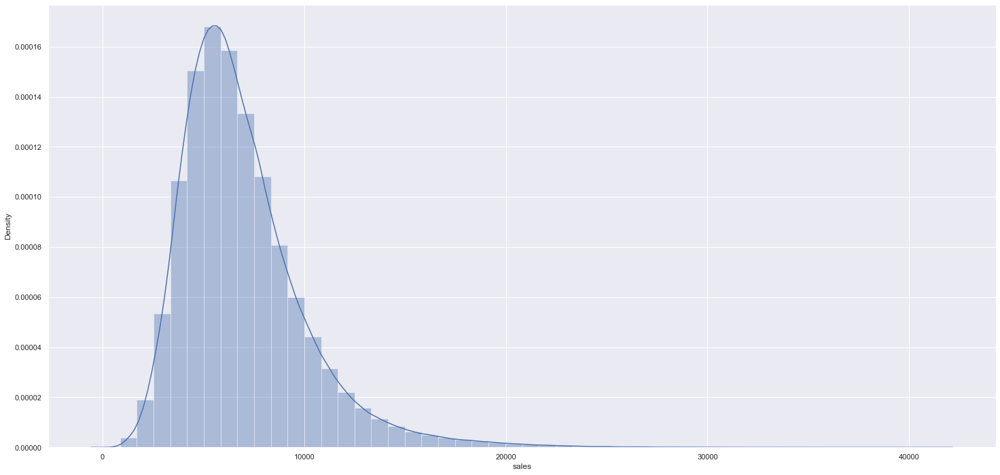

In [25]:
sns.distplot(df4['sales']);

### 4.1.2 Numerical Variable

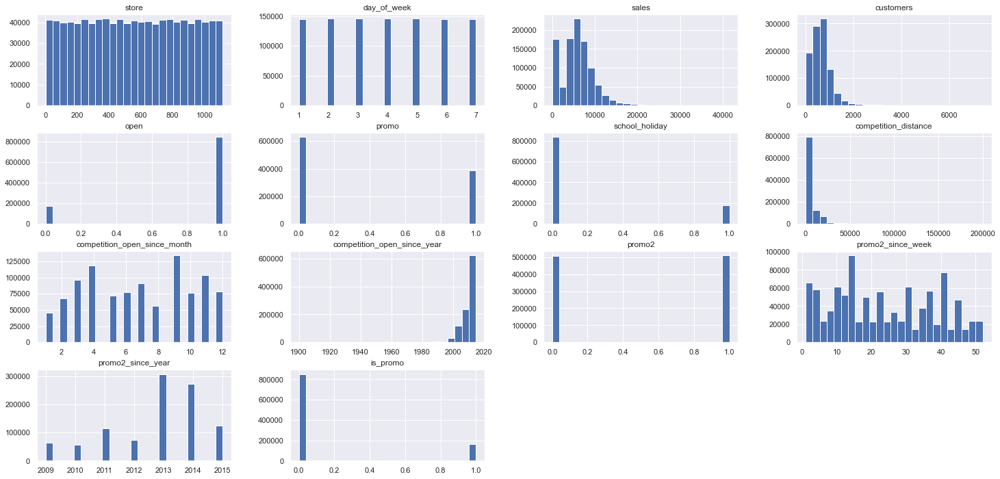

In [26]:
num_attributes.hist(bins=25);

### 4.1.3 Categorical Variable

In [27]:
df4['state_holiday'].drop_duplicates()

0            regular_day
63559     public_holiday
129424    easter_holiday
241126         christmas
Name: state_holiday, dtype: object

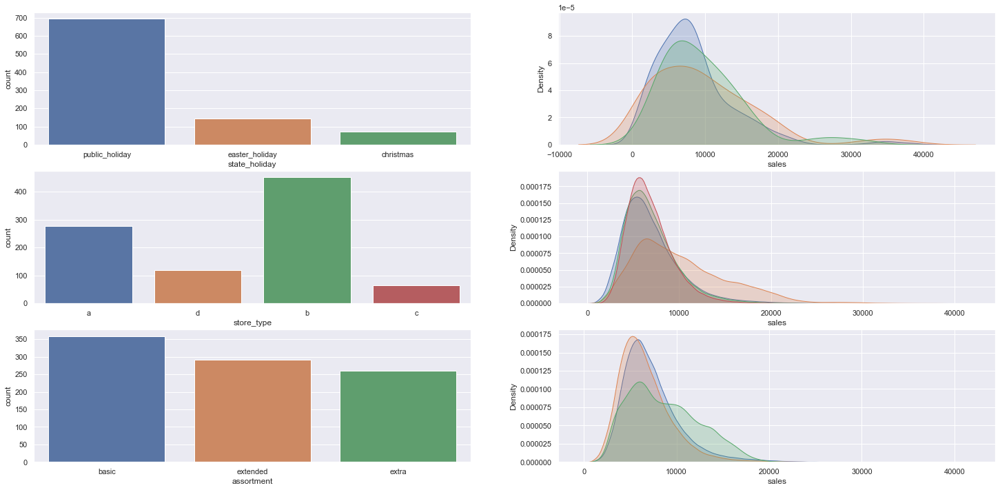

In [28]:
#state holiday

plt.subplot(3, 2, 1)
a = df4[df4['state_holiday']!='regular_day']
sns.countplot(a['state_holiday']);

plt.subplot(3, 2, 2)
sns.kdeplot(df4[df4['state_holiday'] == 'public_holiday']['sales'], label = 'public_holiday', shade=True);
sns.kdeplot(df4[df4['state_holiday'] == 'easter_holiday']['sales'], label = 'easter_holiday', shade=True);
sns.kdeplot(df4[df4['state_holiday'] == 'christmas']['sales'], label = 'christmas', shade=True);

#store type

plt.subplot(3, 2, 3)
sns.countplot(a['store_type']);

plt.subplot(3, 2, 4)
sns.kdeplot(df4[df4['store_type'] == 'a']['sales'], label = 'a', shade=True);
sns.kdeplot(df4[df4['store_type'] == 'b']['sales'], label = 'b', shade=True);
sns.kdeplot(df4[df4['store_type'] == 'c']['sales'], label = 'c', shade=True);
sns.kdeplot(df4[df4['store_type'] == 'd']['sales'], label = 'd', shade=True);

#assortment

plt.subplot(3, 2, 5)
sns.countplot(a['assortment']);

plt.subplot(3, 2, 6)
sns.kdeplot(df4[df4['assortment'] == 'extended']['sales'], label = 'extended', shade=True);
sns.kdeplot(df4[df4['assortment'] == 'basic']['sales'], label = 'basic', shade=True);
sns.kdeplot(df4[df4['assortment'] == 'extra']['sales'], label = 'extra', shade=True);


## 4.2 Análise Bivariada

### H1 Lojas com maior sortimentos deveriam vender mais.
**FALSA** - Lojas com **maior** sortimento vendem **menos**

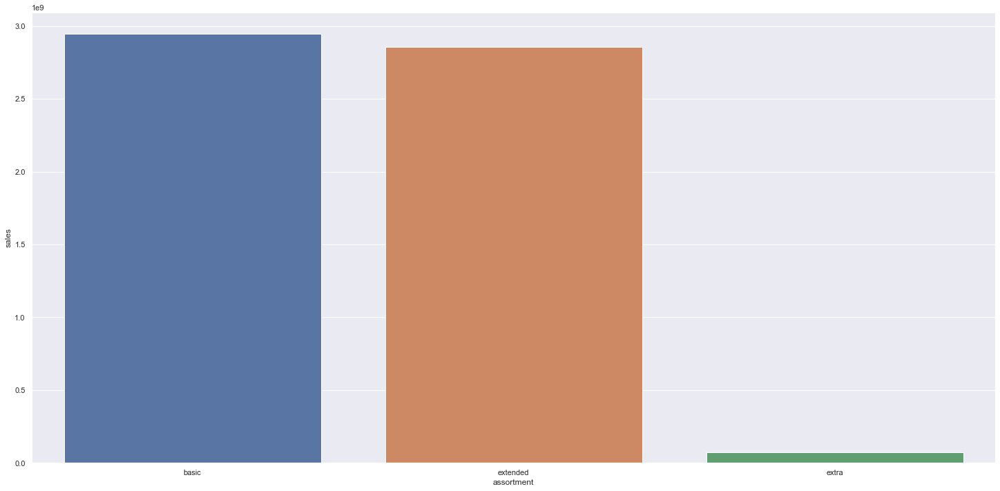

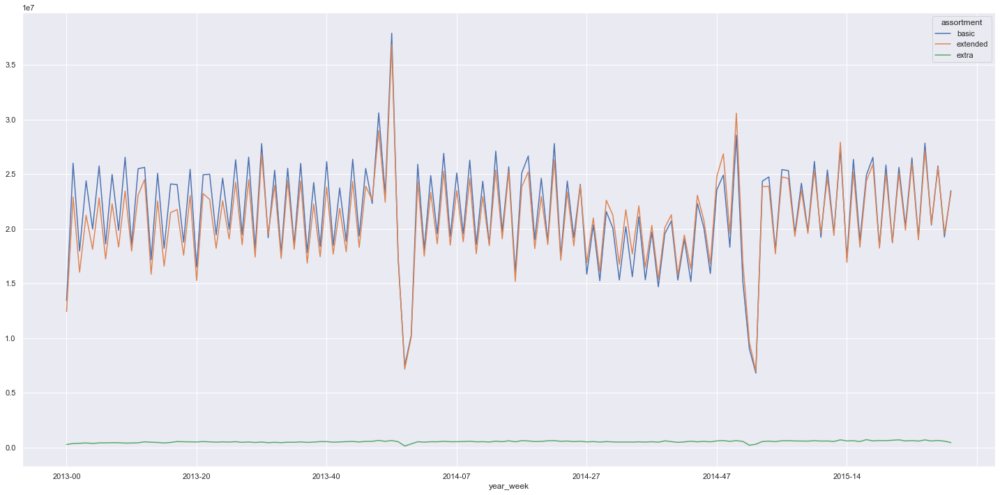

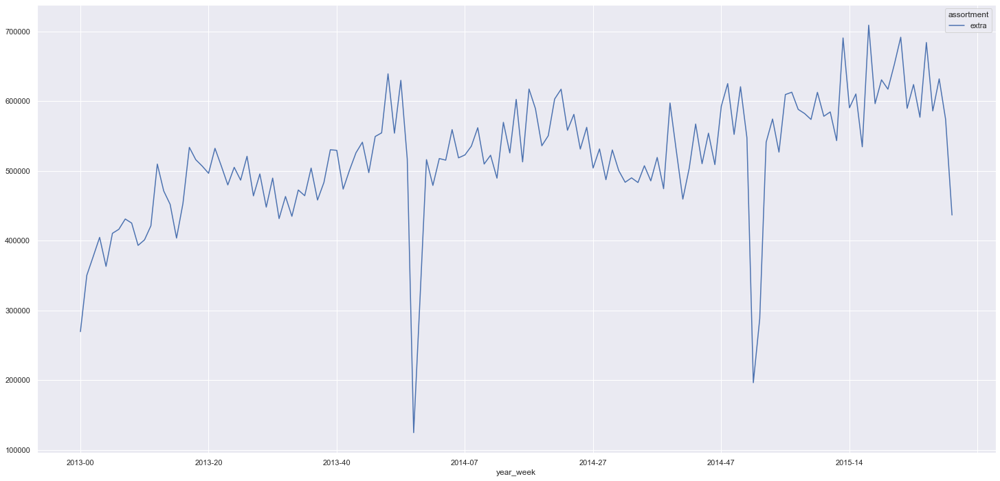

In [29]:
aux1 = df4[['assortment', 'sales']].groupby('assortment').sum().reset_index()
sns.barplot(x='assortment', y='sales', data=aux1);

aux2 = df4[['year_week', 'assortment', 'sales']].groupby(['year_week', 'assortment']).sum().reset_index()
aux2.pivot(index='year_week', columns='assortment', values='sales').plot();

aux3 = aux2[aux2['assortment'] == 'extra'] 
aux3.pivot(index='year_week', columns='assortment', values='sales').plot();

### H2 Lojas com competidores mais próximos deveriam vender menos.
**FALSA** - Lojas com competidores **mais** próximos vendem **mais**

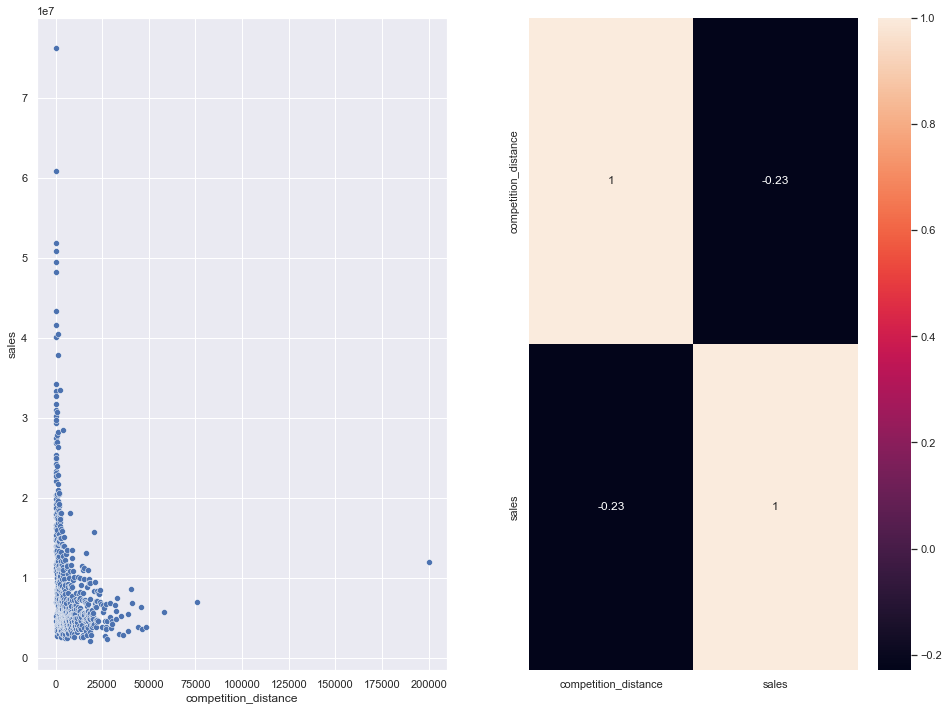

In [30]:
aux1 = df4[['competition_distance', 'sales']].groupby('competition_distance').sum().reset_index()

plt.subplot(1, 3, 1)
sns.scatterplot(x='competition_distance', y='sales', data=aux1);

plt.subplot(1, 3, 2)
bins=list(np.arange(0, 20000, 1000))
aux1['competition_distance_binned'] = pd.cut(aux1['competition_distance'], bins=bins)
aux2 = aux1[['competition_distance_binned', 'sales']].groupby('competition_distance_binned').sum().reset_index()
sns.barplot(x='competition_distance_binned', y='sales', data=aux2);

plt.subplot(1, 3, 2)
sns.heatmap(aux1.corr(method='pearson'), annot=True);

### H3 Lojas com competidores à mais tempo deveriam vender mais.
**FALSA** - Lojas com competidores a **mais** tempo vendem **menos**

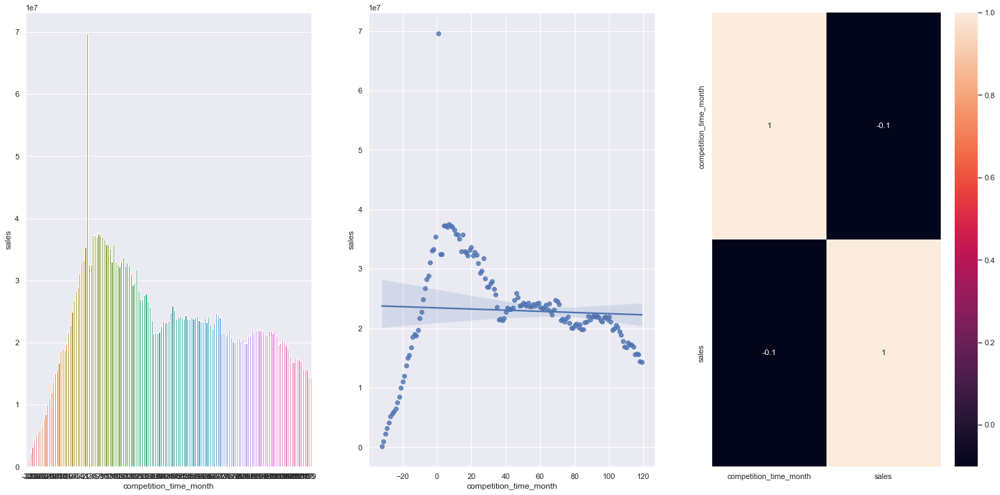

In [31]:
plt.subplot(1, 3, 1)
aux1 = df4[['competition_time_month', 'sales']].groupby('competition_time_month').sum().reset_index()
aux2 = aux1[(aux1['competition_time_month']<120) & (aux1['competition_time_month'] !=0)]
sns.barplot(x='competition_time_month', y='sales', data=aux2);

plt.subplot(1, 3, 2)
sns.regplot(x='competition_time_month', y='sales', data=aux2);

plt.subplot(1, 3, 3)
sns.heatmap(aux1.corr(method='pearson'), annot=True);

### H4 Lojas com promoções ativas por mais tempo deveriam vender mais.
**FALSA** - Lojas com promoções ativas por **mais tempo** vendem **menos** depois de um certo período de promoção

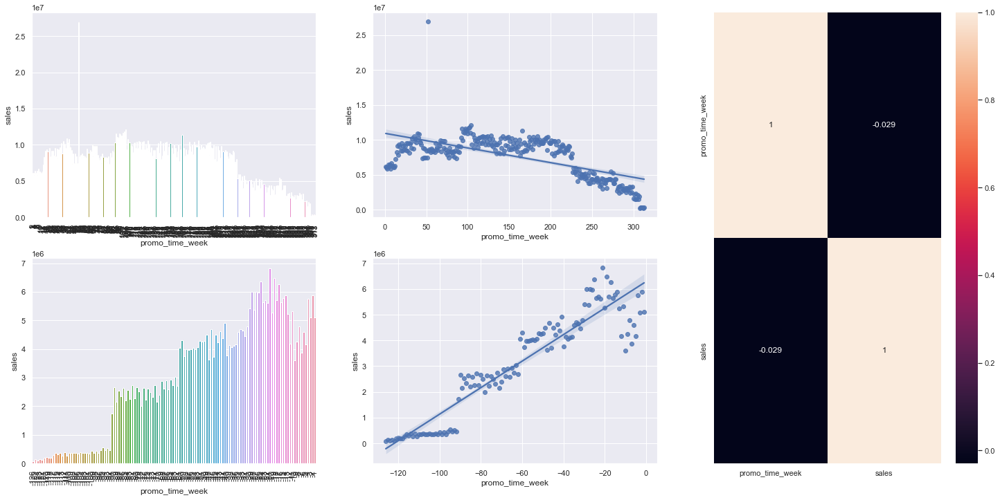

In [32]:
aux1 = df4[['promo_time_week', 'sales']].groupby('promo_time_week').sum().reset_index()

grid = gridspec.GridSpec(2, 3)

plt.subplot(grid[0,0])
aux2 = aux1[aux1['promo_time_week']>0] # promo extendido
sns.barplot(x='promo_time_week', y='sales', data=aux2);
plt.xticks(rotation=90);

plt.subplot(grid[0,1])
sns.regplot(x='promo_time_week', y='sales', data=aux2);

plt.subplot(grid[1,0])
aux3 = aux1[aux1['promo_time_week']<0] # promo regular
sns.barplot(x='promo_time_week', y='sales', data=aux3);
plt.xticks(rotation=90);

plt.subplot(grid[1,1])
sns.regplot(x='promo_time_week', y='sales', data=aux3);

plt.subplot(grid[:,2])
sns.heatmap(aux1.corr(method='pearson'), annot=True);

### <s> H5 Lojas com mais dias de promoção deveriam vender mais. </s>

### H6 Lojas com mais promoções consecutivas deveriam vender mais.
**FALSA** - Lojas com **mais** promoções consecutivas vendem **menos**

In [33]:
df4[['promo', 'promo2', 'sales']].groupby(['promo', 'promo2']).sum().reset_index()

,promo,promo2,sales
0,0,0,1482612096
1,0,1,1289362241
2,1,0,1628930532
3,1,1,1472275754


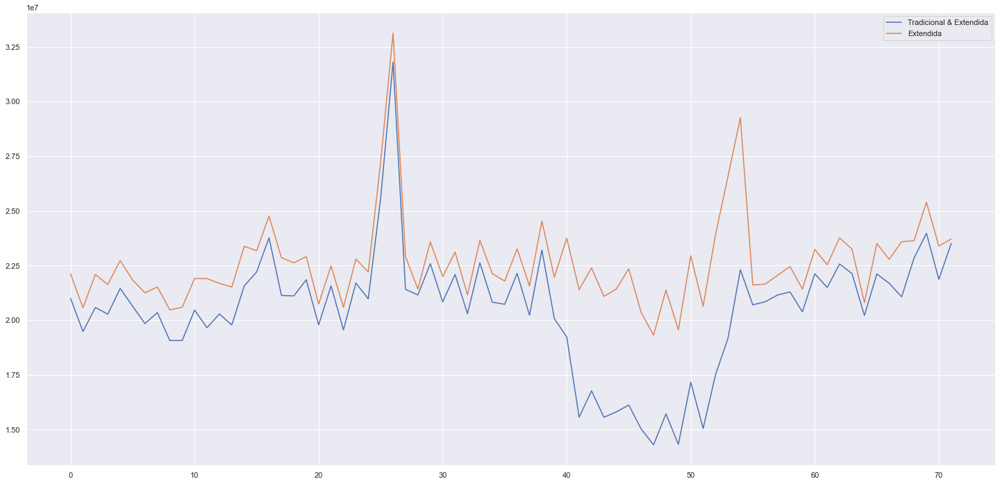

In [34]:
aux1 = df4[(df4['promo']==1) & (df4['promo2']==1)][['year_week', 'sales']].groupby('year_week').sum().reset_index()
ax = aux1.plot();

aux2 = df4[(df4['promo']==1) & (df4['promo2']==0)][['year_week', 'sales']].groupby('year_week').sum().reset_index()
aux2.plot(ax=ax);

ax.legend(labels=['Tradicional & Extendida', 'Extendida']);

### H7 Lojas abertas durante o feriado de Natal deveriam vender mais.
**FALSA** - Lojas abertas durante o feriado de Natal vendem **menos**

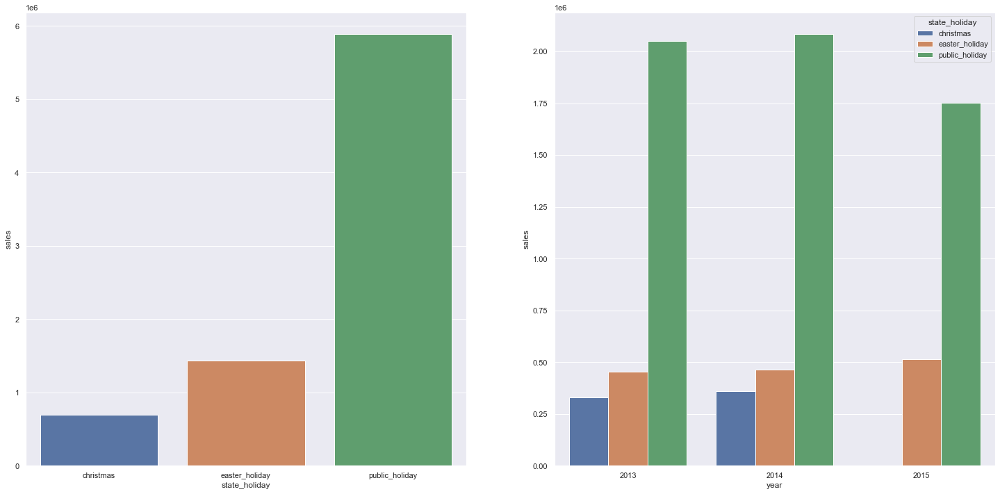

In [35]:
aux = df4[df4['state_holiday']!='regular_day']

plt.subplot(1, 2, 1)
aux1 = aux[['state_holiday', 'sales']].groupby('state_holiday').sum().reset_index()
sns.barplot(x='state_holiday', y='sales', data=aux1);

plt.subplot(1, 2, 2)
aux2 = aux[['year', 'state_holiday', 'sales']].groupby(['year', 'state_holiday']).sum().reset_index()
sns.barplot(x='year', y='sales', hue='state_holiday', data=aux2);

### H8 Lojas deveriam vender mais ao longo dos anos.
**FALSA** - Lojas vendem **menos** ao longo dos anos

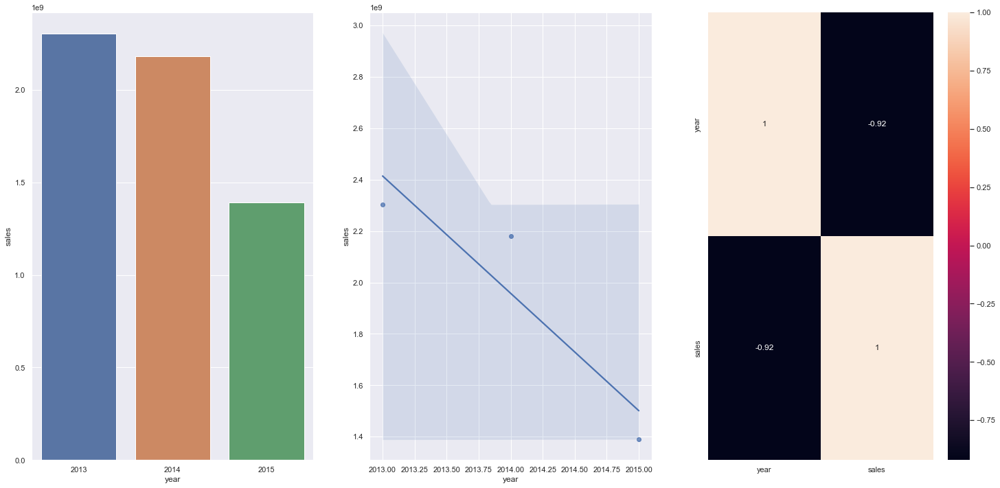

In [36]:
plt.subplot(1, 3, 1)
aux1 = df4[['year', 'sales']].groupby('year').sum().reset_index()
sns.barplot(x='year', y='sales', data=aux1);

plt.subplot(1, 3, 2)
sns.regplot(x='year', y='sales', data=aux1);

plt.subplot(1, 3, 3)
sns.heatmap(aux1.corr(method='pearson'), annot=True);

### H9 Lojas deveriam vender mais no segundo semestre do ano.
**FALSA** - Lojas vendem **menos** no segundo semestre do ano

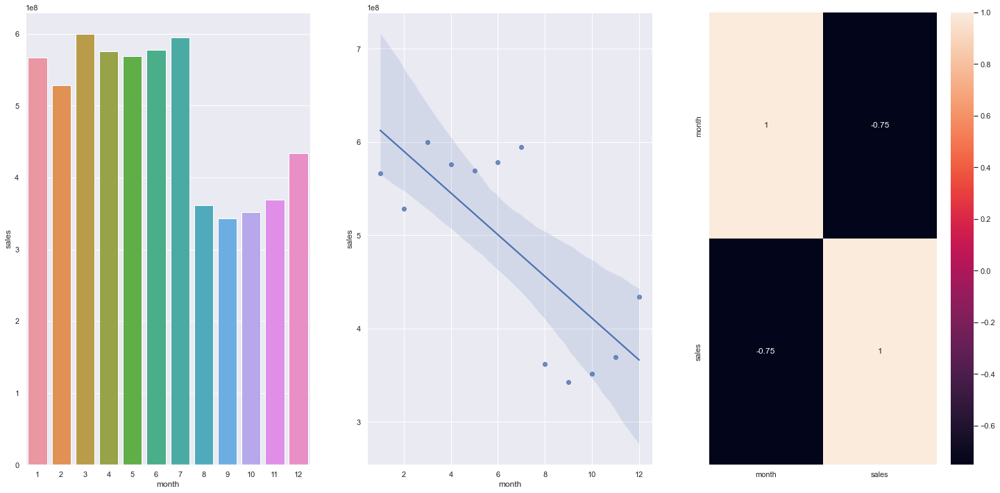

In [37]:
plt.subplot(1, 3, 1)
aux1 = df4[['month', 'sales']].groupby('month').sum().reset_index()
sns.barplot(x='month', y='sales', data=aux1);

plt.subplot(1, 3, 2)
sns.regplot(x='month', y='sales', data=aux1);

plt.subplot(1, 3, 3)
sns.heatmap(aux1.corr(method='pearson'), annot=True);

### H10 Lojas deveriam vender mais depois do dia 10 de cada mês.
**VERDADEIRA** - Lojas vendem mais depois do dia 10 de cada mês

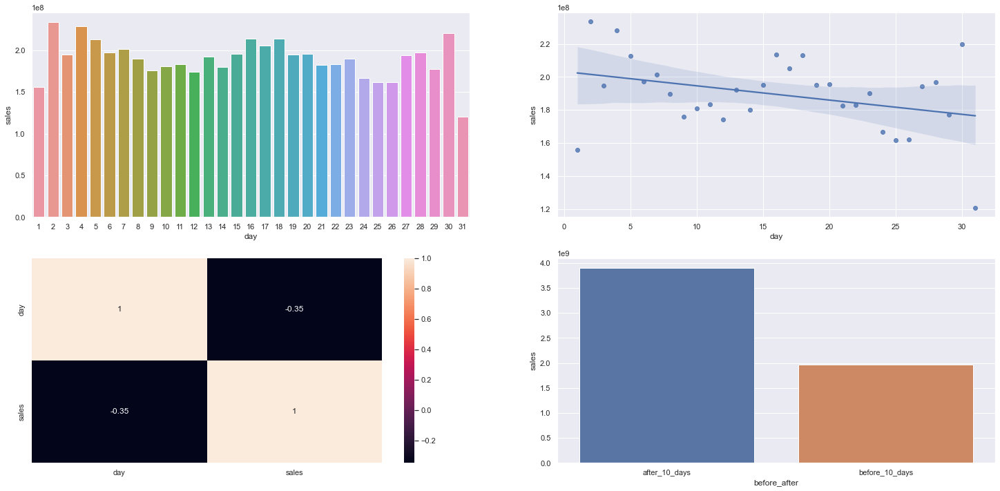

In [38]:
plt.subplot(2, 2, 1)
aux1 = df4[['day', 'sales']].groupby('day').sum().reset_index()
sns.barplot(x='day', y='sales', data=aux1);

plt.subplot(2, 2, 2)
sns.regplot(x='day', y='sales', data=aux1);

plt.subplot(2, 2, 3)
sns.heatmap(aux1.corr(method='pearson'), annot=True);

plt.subplot(2, 2, 4)
aux1['before_after'] = aux1['day'].apply(lambda x: 'before_10_days' if x <= 10 else 'after_10_days')
aux2 = aux1[['before_after', 'sales']].groupby('before_after').sum().reset_index()
sns.barplot(x='before_after', y='sales', data=aux2);

### H11 Lojas deveriam vender menos aos finais de semana.
**VERDADEIRA** - Lojas vendem menos nos finais de semana

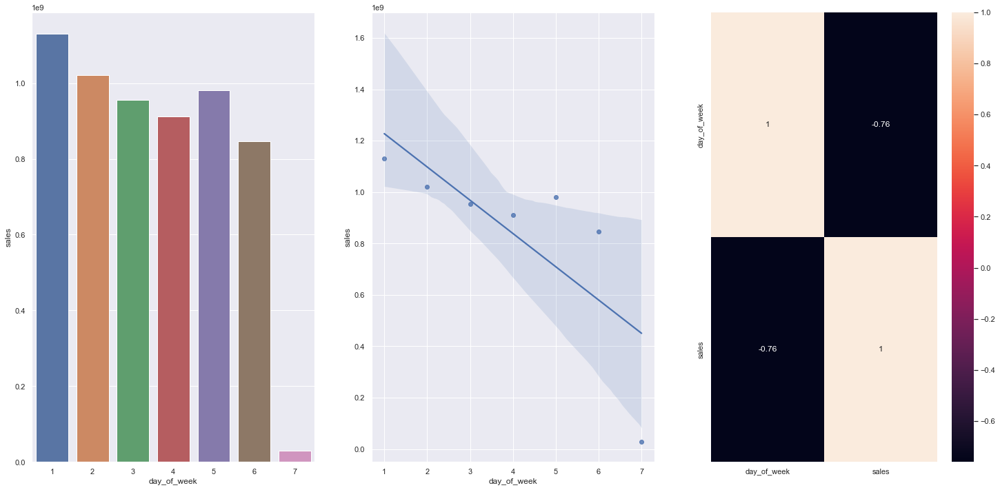

In [39]:
plt.subplot(1, 3, 1)
aux1 = df4[['day_of_week', 'sales']].groupby('day_of_week').sum().reset_index()
sns.barplot(x='day_of_week', y='sales', data=aux1);

plt.subplot(1, 3, 2)
sns.regplot(x='day_of_week', y='sales', data=aux1);

plt.subplot(1, 3, 3)
sns.heatmap(aux1.corr(method='pearson'), annot=True);

### H12 Lojas deveriam vender menos durante os feriados escolares.
**VERDADEIRA** - Lojas vendem menos durante os feriados escolares, exceto os meses de julho e agosto

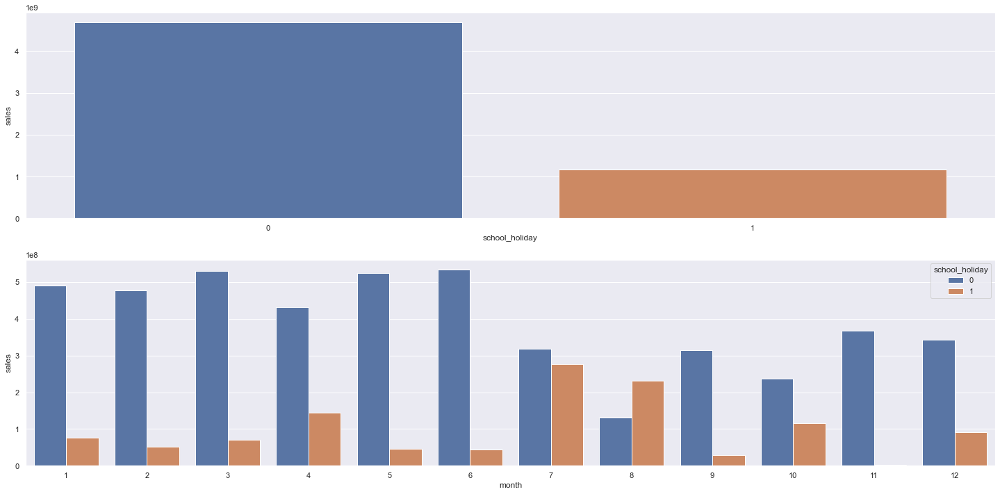

In [40]:
plt.subplot(2, 1, 1)
aux1 = df4[['school_holiday', 'sales']].groupby('school_holiday').sum().reset_index()
sns.barplot(x='school_holiday', y='sales', data=aux1);

plt.subplot(2, 1, 2)
aux2 = df4[['month', 'school_holiday', 'sales']].groupby(['month', 'school_holiday']).sum().reset_index()
sns.barplot(x='month', y='sales', hue='school_holiday', data=aux2);

### 4.2.1 Resumo das Hipóteses

In [41]:
from tabulate import tabulate

In [42]:
tab = [['Hipoteses', 'Conclusao', 'Relevancia'],
       ['H1', 'Falsa', 'Baixa'],
       ['H2', 'Falsa', 'Media'],
       ['H3', 'Falsa', 'Media'],
       ['H4', 'Falsa', 'Baixa'],
       ['H5', '-', '-'],
       ['H6', 'Falsa', 'Baixa'],
       ['H7', 'Falsa', 'Media'],
       ['H8', 'Falsa', 'Alta'],
       ['H9', 'Falsa', 'Alta'],
       ['H10', 'Verdadeira', 'Alta'],
       ['H11', 'Verdadeira', 'Alta'],
       ['H12', 'Verdadeira', 'Baixa']
      ]
print(tabulate(tab, headers='firstrow'))

Hipoteses    Conclusao    Relevancia
-----------  -----------  ------------
H1           Falsa        Baixa
H2           Falsa        Media
H3           Falsa        Media
H4           Falsa        Baixa
H5           -            -
H6           Falsa        Baixa
H7           Falsa        Media
H8           Falsa        Alta
H9           Falsa        Alta
H10          Verdadeira   Alta
H11          Verdadeira   Alta
H12          Verdadeira   Baixa


## 4.3 Análise Multivariada

### 4.3.1 Numerical Attributes

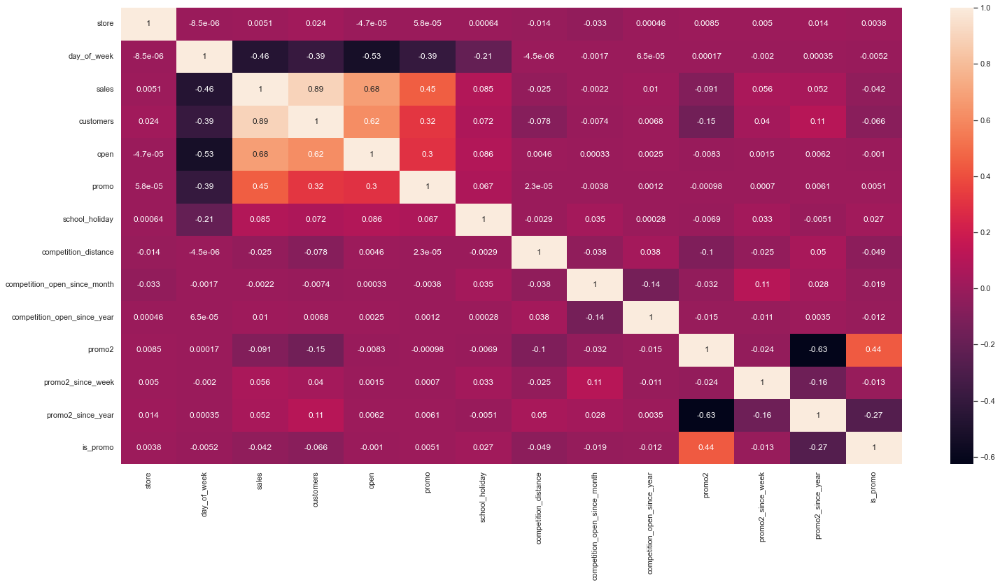

In [43]:
correlation = num_attributes.corr(method='pearson')
sns.heatmap(correlation, annot=True);

### 4.3.2 Categorical Attributes

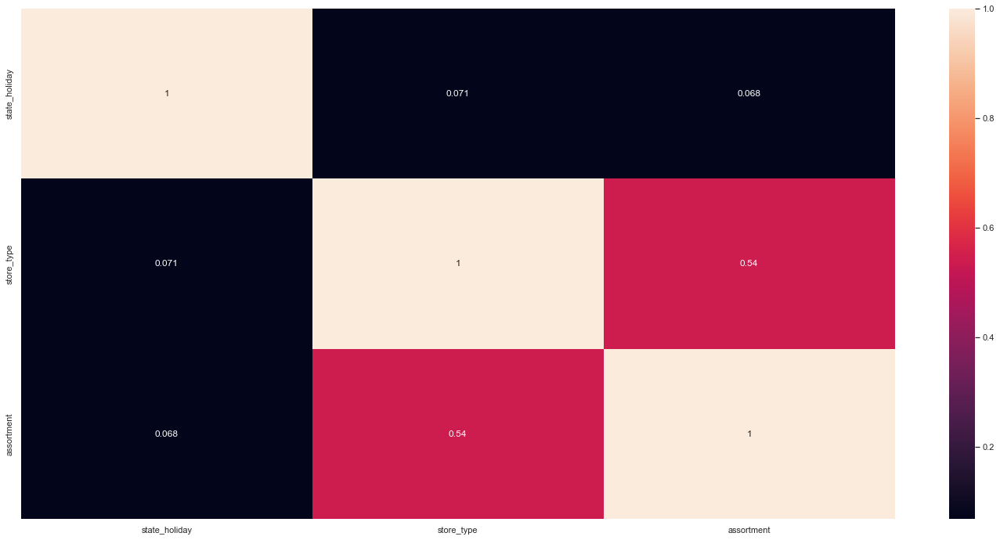

In [44]:
# only categorical data
a = df4.select_dtypes(include='object')

# Calculate Cramer's V
a1 = cramer_v(a['state_holiday'], a['state_holiday'])
a2 = cramer_v(a['state_holiday'], a['store_type'])
a3 = cramer_v(a['state_holiday'], a['assortment'])

a4 = cramer_v(a['store_type'], a['state_holiday'])
a5 = cramer_v(a['store_type'], a['store_type'])
a6 = cramer_v(a['store_type'], a['assortment'])

a7 = cramer_v(a['assortment'], a['state_holiday'])
a8 = cramer_v(a['assortment'], a['store_type'])
a9 = cramer_v(a['assortment'], a['assortment'])

# Final dataset
d = pd.DataFrame({'state_holiday': [a1, a2, a3],
              'store_type': [a4, a5, a6],
              'assortment': [a7, a8, a9]})

d = d.set_index(d.columns)

sns.heatmap(d, annot=True);